# Notes:

Netsquid simulation of QKD with option for multiple wavelengths and decoy states.

In [1]:
"import packages. Numpy, matplotlib, and netsquid are needed."
##########################
import secrets
import numpy as np
import matplotlib.pyplot as plt
import netsquid as ns
from netsquid.components import Channel, QuantumChannel
from netsquid.qubits import qubitapi as qapi
from netsquid.components import QSource, Clock
from netsquid.components.qsource import SourceStatus

In [2]:
"Define a function to set up the network"
###########################

def BB84_network_setup(eve_pres,raw_keylength,drift,loss_rate,ab_distance,ae_distance,eb_distance):
    network=ns.nodes.network.Network("BB84 Network")
    
    #create Alice and Bob nodes with quantum memories
    #Each node needs a port to the quantum channel and the classical channel
    alice=ns.nodes.Node(name='Alice', port_names=['qalice','calice'])
    bob=ns.nodes.Node(name='Bob', port_names=['qbob','cbob'])

    #Create quantum memory subcomponents for alice's and bob's nodes
    bob_qmemory=ns.components.QuantumMemory("BobMemory",num_positions=1)
    bob.add_subcomponent(bob_qmemory,forward_input=[('qbob','qin')])
    alice_qmemory=ns.components.QuantumMemory("AliceMemory",num_positions=1)
    alice.add_subcomponent(alice_qmemory,forward_output=[('qalice','qout')])

    #create a random sampler that will generate 0 states, or None if there is loss.
    bit_sampler=ns.qubits.StateSampler([ns.qubits.ketstates.s0,None],
                                       probabilities=[1-loss_rate, loss_rate]
                                       )

    #create a quantum source to put in Alice's node
    quantum_source=ns.components.qsource.QSource(name='AliceQuantumSource',
                                                 state_sampler=bit_sampler, 
                                                 #trigger according to external source, which will be a clock:
                                                 status=ns.components.qsource.SourceStatus.EXTERNAL) 
    alice.add_subcomponent(quantum_source)

    #send quantum source output to alice's quantum memory so that she can choose a basis and operate on the qubit
    quantum_source.ports['qout0'].connect(alice_qmemory.ports['qin'])

    # Create a clock that will tick 'n' times and connect it to the trigger port of the source.
    clock = Clock("clock", frequency=1e9, max_ticks=raw_keylength)
    alice.add_subcomponent(clock)
    clock.ports["cout"].connect(quantum_source.ports["trigger"])

    #create classical channel from Alice to Bob (and vice versa)
    cchannel_1=ns.components.ClassicalChannel("Channel_A2B", length=ab_distance)
    cchannel_2=ns.components.ClassicalChannel("Channel_B2A", length=ab_distance)
    #use these classical channels to form a 2-way connection
    cconnection=ns.nodes.connections.DirectConnection(name='Classical Connection',
                                                channel_AtoB=cchannel_1,
                                                channel_BtoA=cchannel_2)
    cconnection.ports['A'].forward_input(cchannel_1.ports['send'])
    cchannel_2.ports['recv'].forward_output(cconnection.ports['B'])

    #Create eve node with quantum memory
    eve=ns.nodes.Node(name='Eve', port_names=['qin_eve','qout_eve'])
    eve_qmemory=ns.components.QuantumMemory("EveMemory",num_positions=1)
    eve.add_subcomponent(eve_qmemory,
                         forward_input=[('qin_eve','qin')],
                         forward_output=[('qout_eve','qout')])
    
    qconnection=ns.nodes.connections.Connection("Quantum Connection")
    #model_dict={"delay_model":ns.components.models.delaymodels.FibreDelayModel(),'quantum_noise_model':ns.components.models.qerrormodels.DepolarNoiseModel(depolar_rate=drift,time_independent=True)}
    model_dict={'quantum_noise_model':ns.components.models.qerrormodels.DepolarNoiseModel(depolar_rate=drift,time_independent=True)}
    
    if eve_pres==True:
        #create two quantum channels from Alice to Eve, then Eve to Bob
        ae_channel=QuantumChannel(name='Quantum Channel A2E', length=ae_distance, models=model_dict)
        eb_channel=QuantumChannel(name='Quantum Channel E2B', length=eb_distance, models=model_dict)

        #add Eve node and channels as subcomponents
        qconnection.add_subcomponent(ae_channel,
                             name='A2E Channel',
                             forward_input=[('A','send')])
        qconnection.add_subcomponent(eb_channel,
                             name='E2B Channel',
                             forward_output=[('B','recv')])
        qconnection.add_subcomponent(eve, name='Eve')

        #forward connection inputs to the A2E channel, then to Eve's node, then output to E2B channel
        ae_channel.ports['recv'].connect(eve.ports['qin_eve'])
        eve.ports['qout_eve'].connect(eb_channel.ports['send'])
    elif eve_pres==False:
        #create a quantum channel from Alice to Bob
        quantum_channel=QuantumChannel(name='Quantum Channel', length=ab_distance, models=model_dict)
        #add the quantum channel as a subcomponent of quantum connection, which is used to connect Alice and Bob's nodes.
        qconnection.add_subcomponent(quantum_channel,
                                     name='Quantum Channel', 
                                     forward_input=[('A','send')], 
                                     forward_output=[('B','recv')])
    
    #add nodes and connections to network
    network.add_nodes([alice,bob])
    network.add_connection(node1=alice,node2=bob,connection=qconnection,label='QuantumConnection', port_name_node1='qalice', port_name_node2='qbob')
    network.add_connection(node1=alice,node2=bob,connection=cconnection,label='ClassicalConnection',port_name_node1='calice', port_name_node2='cbob')
    return network, clock, eve
            

In [3]:
"Create a frequency qubit subclass of netsquid's qubit class."
#############################################################

class WavelengthQubit(ns.qubits.qubit.Qubit):
    def __init__(self,name,qstate,wavelength):
        #wavelength qubit inherits the same attributes ('name' and 'qstate')
        self.name=name
        self.qstate=qstate
        #additionally, wavelength qubits have the attribute 'wavelength'
        self.wavelength=wavelength

#Function which creates a w-qubit, inheriting name and state of original provided qubit and assigning a wavelength.
def make_wavelength_qubit(qubit,wavelength):
    #inherit name and qstate from qubit
    name=qubit.name
    qstate=qubit.qstate
    #create w-qubit object with name,qstate, and wavelength  
    wavelength_qubit=WavelengthQubit(name,qstate,wavelength)
    return wavelength_qubit

In [4]:
"Define the Protocol"
#######################

class BB84_protocol(ns.protocols.nodeprotocols.LocalProtocol):
    def run(self):
        print(f"Starting BB84 at t={ns.sim_time()}")
        
        #the LocalProtocol class runs on a list of node(s)
        node_list=self.nodes
        
        print(node_list)
        alice=node_list['Alice']
        bob=node_list['Bob']
        eve=node_list['Eve']
        alice_qmemory=alice.qmemory
        bob_qmemory=bob.qmemory
        eve_qmemory=eve.qmemory
        
        while True:
            print()
            #wait until Alice emits a qubit to prepare it
            yield self.await_port_input(alice_qmemory.ports['qin'])
            print(f"sim time t={ns.sim_time()}")
            qubit=alice_qmemory.peek(0)[0]
            
            #randomly select state
            state=secrets.choice(states)
            #match quantum state with bit mapping
            for t in range(len(states)):
                if state==states[t]:
                    bit=bit_mapping[t]
            wavelength=state[0]
            basis=state[1]
            signed_bit=state[2]
            print('wavelength: ', wavelength)
            print('basis: ', basis)
            print('signed eigenstate bit: ', signed_bit)
            print('bit: ', bit)
            
            #store information about the state alice sent
            alice_bits.append(bit)
            alice_signed_bits.append(signed_bit)
            alice_basis.append(basis)
            qubit_wavelengths.append(wavelength)
            
            #create 'copy' of qubit as a wavelength qubit with wavelength attribute.
            wavelength_qubit=make_wavelength_qubit(qubit,wavelength)
            #replace alice's quantum memory with wavelength qubit, and redefine 'qubit' as this.
            alice_qmemory.put(wavelength_qubit,positions=0,replace=True)
            qubit=alice_qmemory.peek(0)[0]
            
            #The above is not what happens physically; but to my knowledge, StateSampler won't work well
            #because it randomly generates quantum states, not qubits themselves, and wavelength is an  
            #attribute that, as I have defined it, gets added to qubits, not quantum states.
            
            #turn qubit into chosen state
            state_transformation=(basis*ns.H+(1-basis)*ns.I)*(signed_bit*ns.X+(1-signed_bit)*ns.I)
            ns.qubits.qubitapi.operate(qubit,state_transformation)
            print("Starting qubit:")
            print(qubit)
            print(qubit.qstate.qrepr)
            
            #check if qubit is a decoy state. If so, discard it.
            is_decoy=False
            print('check ',[wavelength,basis,signed_bit] )
            for decoy in decoy_states:
                print('decoy ', decoy)
                if [wavelength,basis,signed_bit]==decoy:
                    print('this is a decoy state, so Alice does not send.')
                    is_decoy=True
                    break
            if is_decoy==True:
                print('Start new qubit.')
                continue

            #Once the qubit is prepared, send to Bob
            alice_qmemory.pop(positions=0)
            if alice_qmemory.peek(0)[0] is None:
                print('alice sent the qubit.')
            else:
                print('alice did not send the qubit.')
            
            #if eve is there, she eavesdrops
            if eve_present:
                #eve selects a basis randomly
                eve_basis_label=secrets.choice([0,1])
                eve_basis.append(int(eve_basis_label))
                if int(eve_basis_label)==0:
                    current_eve_basis=ns.Z
                    print('eve basis', current_eve_basis.name)
                elif int(eve_basis_label)==1:
                    current_eve_basis=ns.H
                    print('eve basis', current_eve_basis.name)
                else:
                    print('uh oh, eve didnt pick a proper basis')
                
                yield self.await_port_input(eve_qmemory.ports['qin'])
                print('eve recieves qubit ',eve_qmemory.peek(0))
                
                #transform basis before and after measurement
                eve_qmemory.operate(operator=current_eve_basis,positions=0,skip_noise=True)
                bit_list,_ =eve_qmemory.measure(positions=0, skip_noise=True)
                eve_qmemory.operate(operator=current_eve_basis,positions=0,skip_noise=True)
                qubit=eve_qmemory.peek(0)[0]
                print('qubit after eve measures is:', qubit.qstate.qrepr)
                
                #check what bit value the quantum state maps to.
                eve_state=[wavelength,eve_basis_label,bit_list[0]]
                for t in range(len(states)):
                    if eve_state==states[t]:
                        bit=bit_mapping[t]
                eve_bits.append(bit)
                eve_signed_bits.append(bit_list[0])
                print('eve records bit ', bit)
                
                #eve has measured the qubit, so she sends it onward to bob.
                eve_qmemory.pop(positions=0)
                if eve_qmemory.peek(0)[0] is None:
                    print('eve sent the qubit.')
                else:
                    print('eve did not send the qubit.')
            
            #Bob needs to randomly select a basis
            bob_basis_label=secrets.choice([0,1])
            bob_basis.append(int(bob_basis_label))
            if int(bob_basis_label)==0:
                current_bob_basis=ns.Z
                print('bob basis', current_bob_basis.name)
            elif int(bob_basis_label)==1:
                current_bob_basis=ns.H
                print('bob basis', current_bob_basis.name)
            else:
                print('uh oh, bob didnt pick a proper basis')
            
            #wait until Bob receives the qubit
            yield self.await_port_input(bob_qmemory.ports['qin'])
            print('bob receives qubit ',bob_qmemory.peek(0))
            qubit=bob_qmemory.peek(0)[0]
            print('state before bob measures: ', qubit.qstate.qrepr)
            print(f"sim time t={ns.sim_time()}")
            #qubit=bob_qmemory.peek(0)[0]
            #print(qubit.qstate.qrepr)
            
            #Bob operates on qubit to transform into his basis
            bob_qmemory.operate(operator=current_bob_basis,positions=0,skip_noise=True)
            bit_list,_ =bob_qmemory.measure(positions=0, skip_noise=True)
            bob_qmemory.operate(operator=current_bob_basis,positions=0,skip_noise=True)
            qubit=bob_qmemory.peek(0)[0]
            print('qubit after bob measures is:', qubit.qstate.qrepr)
            
            #Bob checks if qubit is a decoy state.
            bob_state=[wavelength,bob_basis_label,bit_list[0]]
            is_decoy=False
            for decoy in decoy_states:
                if bob_state==decoy:
                    print('Bob measured a decoy state.')
                    is_decoy=True
                    break
            #Bob checks what bit value the quantum state maps to. If it is a decoy, he assigns a bit value of '3'
            if is_decoy==True:
                bit=3
            else:
                for t in range(len(states)):
                    if bob_state==states[t]:
                        bit=bit_mapping[t]
                        break
            bob_bits.append(bit)
            bob_signed_bits.append(bit_list[0])
            print('bob records bit', bit)
            

In [5]:
"Starting parameters:"
#######################
eve_present=True #is eve going to eavesdrop? Must always be set correctly before running the protocol
n=1000 #raw key length
wavelengths=[1550,1310] #nm
states=[[1550,0,0],
        [1550,0,1],
        [1550,1,1],
        [1310,0,0],
        [1310,1,0],
        [1310,1,1]] #states that alice will send to bob. 00=|0>, 01=|1>, 10=|+>, 11= |->
#[wavelength, basis (0/1 basis=rectilinear/diagonal), bit according to sign of eigenstate]

bit_mapping=[1,0,2,2,0,1] #actual encoding of quantum states
decoy_states=[[1550,1,0],[1310,0,1]] #wavelength, then basis, then bit. (0/1 basis=rectilinear/diagonal)
ab_distance=3e-3 #distance of quantum channel between alice and bob (km)
ae_distance=1e-3 #distance between alice's and Eve's nodes (km)
eb_distance=2e-3 #distance between eve's and bob's nodes (km)

"""
#Traditional BB84 states and mappings
states=[[1550,0,0],
        [1550,0,1],
        [1550,1,1],
        [1550,1,0]]
decoy_states=[]
bit_mapping=[0,1,1,0]
"""


'\n#Traditional BB84 states and mappings\nstates=[[1550,0,0],\n        [1550,0,1],\n        [1550,1,1],\n        [1550,1,0]]\ndecoy_states=[]\nbit_mapping=[0,1,1,0]\n'

In [6]:
"Run a simulation"
#########################

#before setting up network and protocols, reset simulation and set quantum formalism to density matrix.
ns.sim_reset() 
ns.set_qstate_formalism(ns.qubits.qformalism.QFormalism.DM)

#lists for storing bit and basis values and wavelengths (0-basis = rectilinear, 1-basis = diagonal)
alice_basis=[]
alice_bits=[]
alice_signed_bits=[]
bob_basis=[]
bob_bits=[]
bob_signed_bits=[]
eve_basis=[]
eve_bits=[]
eve_signed_bits=[]
qubit_wavelengths=[]

#set up the network for this simulation run.
bb84_network,clock,eve=BB84_network_setup(eve_present,n,0.0,0,ab_distance,ae_distance,eb_distance)
print(bb84_network)
print(clock)
print(eve)
alice=bb84_network.get_node('Alice')
bob=bb84_network.get_node('Bob')
print(alice)
print(bob)

#assign the protocol and start the protocol
prot=BB84_protocol({alice.name:alice, bob.name:bob, eve.name:eve})
prot.start()

#start the clock
clock.start()

#run simulation
ns.sim_run()

Network(name='BB84 Network')
Clock(name='clock')
Node(name='Eve')
Node(name='Alice')
Node(name='Bob')
Starting BB84 at t=0.0
ConstrainedMap({'Alice': Node(name='Alice'), 'Bob': Node(name='Bob'), 'Eve': Node(name='Eve')})

sim time t=0.0
wavelength:  1310
basis:  1
signed eigenstate bit:  1
bit:  1
Starting qubit:
Qubit('AliceQuantumSource-#1-0')
DenseDMRepr(num_qubits=1, dm=
[[ 0.5+0.j -0.5+0.j]
 [-0.5+0.j  0.5+0.j]])
check  [1310, 1, 1]
decoy  [1550, 1, 0]
decoy  [1310, 0, 1]
alice sent the qubit.
eve basis H
eve recieves qubit  [Qubit('AliceQuantumSource-#1-0')]
qubit after eve measures is: DenseDMRepr(num_qubits=1, dm=
[[ 0.5+0.j -0.5+0.j]
 [-0.5+0.j  0.5+0.j]])
eve records bit  1
eve sent the qubit.
bob basis Z
bob receives qubit  [Qubit('AliceQuantumSource-#1-0')]
state before bob measures:  DenseDMRepr(num_qubits=1, dm=
[[ 0.5+0.j -0.5+0.j]
 [-0.5+0.j  0.5+0.j]])
sim time t=0.0
qubit after bob measures is: DenseDMRepr(num_qubits=1, dm=
[[0.+0.j 0.+0.j]
 [0.+0.j 1.+0.j]])
Bob meas

SimStats()

In [7]:
"Simulation output data"
##########################
import numpy as np

#calculate how many bits have matching basis, and how many bits match out of those that have matching basis
basismatch=sum(np.array(alice_basis)==np.array(bob_basis))
bitmatch=sum((np.array(alice_bits)==np.array(bob_bits)) & (np.array(alice_basis)==np.array(bob_basis)))

print('key reduced to '+str(len(alice_basis))+'/'+str(n))
print('basis match: ', basismatch/len(alice_basis))
print('error rate: ', 1-bitmatch/basismatch)

bob_num_decoys=sum((np.array(bob_bits)==3) & (np.array(alice_basis)==np.array(bob_basis)))
alice_num_decoys=sum(np.array(alice_bits)==3)
bob_decoys_any_basis=sum(np.array(bob_bits)==3)
    
print('Alice sent '+str(alice_num_decoys)+' decoy states.')
print('Bob measured '+str(bob_num_decoys)+' decoy states with matching basis.')
print('decoy key proportion '+str(bob_num_decoys/basismatch))
print('including non-matching bases, bob saw '+str(bob_decoys_any_basis)+' decoys')


key reduced to 1000/1000
basis match:  0.503
error rate:  0.24254473161033796
Alice sent 0 decoy states.
Bob measured 44 decoy states with matching basis.
decoy key proportion 0.0874751491053678
including non-matching bases, bob saw 223 decoys


In [8]:
"Run many simulations with different depolarization"
######################

depolar_rates=np.array([0,0.25,0.5,0.75,1.0]) #array of depolarization probabilities to iterate over
loss_rate=0
n=1000 #raw key length

#arrays for output data. 2 rows are created for eve present and no eve present scenarios
QBER=np.zeros((2,len(depolar_rates)))
alice_decoys=np.zeros((2,len(depolar_rates)))
raw_bob_decoys=np.zeros((2,len(depolar_rates)))
sifted_bob_decoys=np.zeros((2,len(depolar_rates)))

for eve_present in [False,True]:
    print('eve is '+str(eve_present))
    for d in range(len(depolar_rates)):
        depolar_rate=depolar_rates[d]
        
        #lists for storing bit and basis values and wavelengths (0-basis = rectilinear, 1-basis = diagonal)
        alice_basis=[]
        alice_bits=[]
        alice_signed_bits=[]
        bob_basis=[]
        bob_bits=[]
        bob_signed_bits=[]
        eve_basis=[]
        eve_bits=[]
        eve_signed_bits=[]
        qubit_wavelengths=[]

        ns.sim_reset()

        bb84_network, clock, eve=BB84_network_setup(eve_present,n,depolar_rate,loss_rate,ab_distance,ae_distance,eb_distance)
        print(bb84_network)
        print(clock)
        print(eve)
        alice=bb84_network.get_node('Alice')
        bob=bb84_network.get_node('Bob')
        print(alice)
        print(bob)

        prot=BB84_protocol({alice.name:alice, bob.name:bob, eve.name:eve})
        prot.start()
        clock.start()
        ns.sim_run()

        basismatch=sum(np.array(alice_basis)==np.array(bob_basis))
        bitmatch=sum((np.array(alice_bits)==np.array(bob_bits)) & (np.array(alice_basis)==np.array(bob_basis)))
        QBER[int(eve_present),d] =1-bitmatch/basismatch

        bob_num_decoys=sum((np.array(bob_bits)==3) & (np.array(alice_basis)==np.array(bob_basis)))
        alice_num_decoys=sum(np.array(alice_bits)==3)
        bob_decoys_any_basis=sum(np.array(bob_bits)==3)
        
        sifted_bob_decoys[int(eve_present),d]=bob_num_decoys/basismatch
        alice_decoys[int(eve_present),d]=alice_num_decoys
        raw_bob_decoys[int(eve_present),d]=bob_decoys_any_basis/n


eve is False
Network(name='BB84 Network')
Clock(name='clock')
Node(name='Eve')
Node(name='Alice')
Node(name='Bob')
Starting BB84 at t=0.0
ConstrainedMap({'Alice': Node(name='Alice'), 'Bob': Node(name='Bob'), 'Eve': Node(name='Eve')})

sim time t=0.0
wavelength:  1310
basis:  1
signed eigenstate bit:  1
bit:  1
Starting qubit:
Qubit('AliceQuantumSource-#1-0')
DenseDMRepr(num_qubits=1, dm=
[[ 0.5+0.j -0.5+0.j]
 [-0.5+0.j  0.5+0.j]])
check  [1310, 1, 1]
decoy  [1550, 1, 0]
decoy  [1310, 0, 1]
alice sent the qubit.
bob basis Z
bob receives qubit  [Qubit('AliceQuantumSource-#1-0')]
state before bob measures:  DenseDMRepr(num_qubits=1, dm=
[[ 0.5+0.j -0.5+0.j]
 [-0.5+0.j  0.5+0.j]])
sim time t=0.0
qubit after bob measures is: DenseDMRepr(num_qubits=1, dm=
[[1.+0.j 0.+0.j]
 [0.+0.j 0.+0.j]])
bob records bit 2

sim time t=1.0
wavelength:  1310
basis:  1
signed eigenstate bit:  0
bit:  0
Starting qubit:
Qubit('AliceQuantumSource-#2-0')
DenseDMRepr(num_qubits=1, dm=
[[0.5+0.j 0.5+0.j]
 [0.5+0.j 

In [9]:
print(QBER)
print(sifted_bob_decoys)
print(alice_decoys)

[[0.         0.12989691 0.25148515 0.40316206 0.52298851]
 [0.25510204 0.35564054 0.41683778 0.45525292 0.51047619]]
[[0.         0.03298969 0.07128713 0.1284585  0.16666667]
 [0.07142857 0.11854685 0.11704312 0.13618677 0.17142857]]
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]


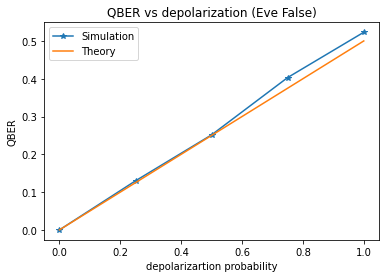

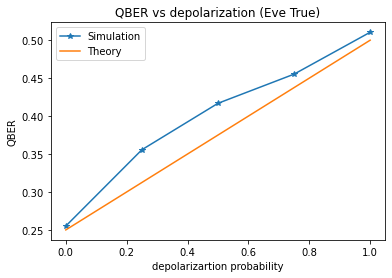

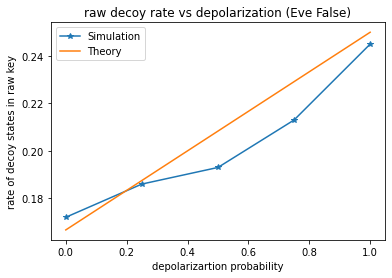

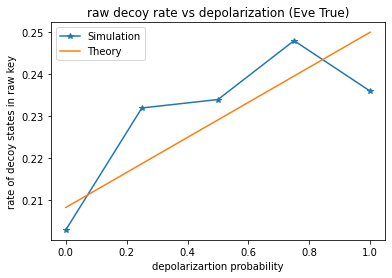

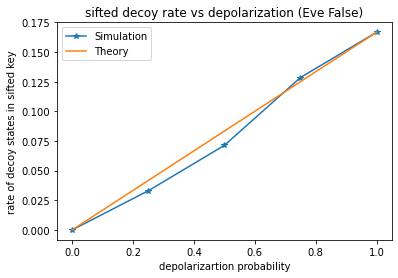

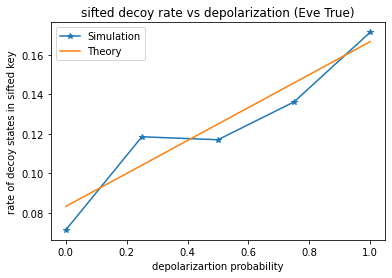

In [11]:
"make some plots"
###########################

import matplotlib.pyplot as plt

legend=('Simulation','Theory')

plt.figure()
plt.title('QBER vs depolarization (Eve False)')
plt.plot(depolar_rates,QBER[0],'*-')
plt.plot(depolar_rates,depolar_rates*1/2)
plt.xlabel('depolarizartion probability')
plt.ylabel('QBER')
plt.legend(legend)
plt.savefig('')

plt.figure()
plt.title('QBER vs depolarization (Eve True)')
plt.plot(depolar_rates,QBER[1],'*-')
plt.plot(depolar_rates,depolar_rates*1/4+1/4)
plt.xlabel('depolarizartion probability')
plt.ylabel('QBER')
plt.legend(legend)

plt.figure()
plt.title('raw decoy rate vs depolarization (Eve False)')
plt.plot(depolar_rates,raw_bob_decoys[0],'*-')
plt.plot(depolar_rates,depolar_rates*1/12+1/6)
plt.xlabel('depolarizartion probability')
plt.ylabel('rate of decoy states in raw key')
plt.legend(legend)

plt.figure()
plt.title('raw decoy rate vs depolarization (Eve True)')
plt.plot(depolar_rates,raw_bob_decoys[1],'*-')
plt.plot(depolar_rates,depolar_rates*1/24+5/24)
plt.xlabel('depolarizartion probability')
plt.ylabel('rate of decoy states in raw key')
plt.legend(legend)

plt.figure()
plt.title('sifted decoy rate vs depolarization (Eve False)')
plt.plot(depolar_rates,sifted_bob_decoys[0],'*-')
plt.plot(depolar_rates,depolar_rates*1/6)
plt.xlabel('depolarizartion probability')
plt.ylabel('rate of decoy states in sifted key')
plt.legend(legend)

plt.figure()
plt.title('sifted decoy rate vs depolarization (Eve True)')
plt.plot(depolar_rates,sifted_bob_decoys[1],'*-')
plt.plot(depolar_rates,depolar_rates*1/12+1/12)
plt.xlabel('depolarizartion probability')
plt.ylabel('rate of decoy states in sifted key')
plt.legend(legend)